# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

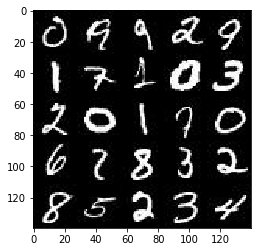

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

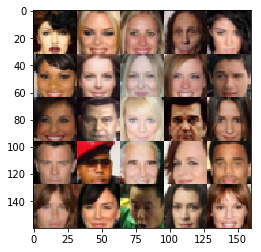

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 32, 32, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    inputs_lr = tf.placeholder(tf.float32, (None), name='input_lr')

    return inputs_real, inputs_z, inputs_lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 32, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn1 = tf.layers.batch_normalization(x1, training=True)
        relu1 = tf.maximum(alpha * bn1, bn1)
        do1 = tf.layers.dropout(relu1, 0.75)
        
        
        x2 = tf.layers.conv2d(do1, 64, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        do2 = tf.layers.dropout(relu2, 0.75)
        
        x3 = tf.layers.conv2d(do2, 128, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        do3 = tf.layers.dropout(relu3, 0.75)
        
        x4 = tf.layers.conv2d(do3, 256, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn4 = tf.layers.batch_normalization(x4, training=True)
        relu4 = tf.maximum(alpha * bn4, bn4)
        do4 = tf.layers.dropout(relu4, 0.75)
        
   
        flat = tf.reshape(do4, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim,is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator',reuse=False if is_train==True else True):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=1, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14x14x128 now
        
        x4 = tf.layers.conv2d_transpose(x3, 64, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha * x4, x4)
        # 28x28x64 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 5, strides=1, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
    return out
    
  


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #tf.reset_default_graph()
    b_input_real, b_input_z, b_input_lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(b_input_real, b_input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    print_every = 10
    show_every = 100
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                batch_images = batch_images * 2
                steps += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={ b_input_real: batch_images, b_input_z: batch_z, b_input_lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={ b_input_real: batch_images, b_input_z: batch_z, b_input_lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={ b_input_real: batch_images, b_input_z: batch_z, b_input_lr: learning_rate})

                
                if steps % 100 == 0:
                    # At the end of every 10 epochs, get the losses and print them out
                    train_loss_d = d_loss.eval({b_input_z: batch_z, b_input_real: batch_images})
                    train_loss_g = g_loss.eval({b_input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    _ = show_generator_output(sess, 25, b_input_z, data_shape[3], data_image_mode)
               
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 3.3411... Generator Loss: 0.0780


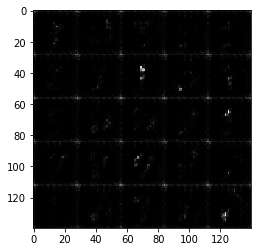

Epoch 1/2... Discriminator Loss: 2.4929... Generator Loss: 0.3133


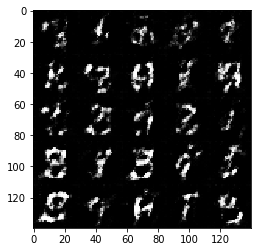

Epoch 1/2... Discriminator Loss: 2.2733... Generator Loss: 0.2546


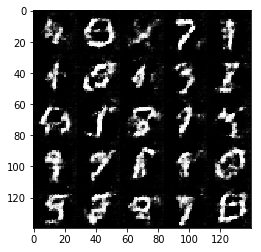

Epoch 1/2... Discriminator Loss: 2.1461... Generator Loss: 0.2096


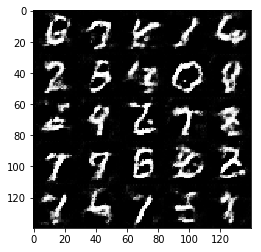

Epoch 1/2... Discriminator Loss: 1.8407... Generator Loss: 0.3577


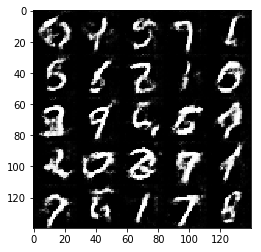

Epoch 1/2... Discriminator Loss: 2.3860... Generator Loss: 0.1248


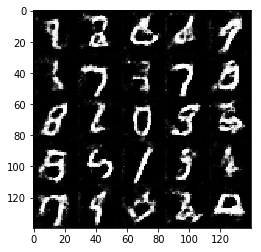

Epoch 1/2... Discriminator Loss: 1.8144... Generator Loss: 0.3454


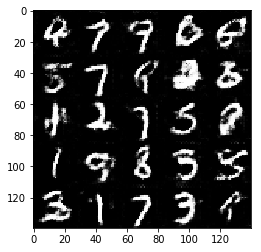

Epoch 1/2... Discriminator Loss: 1.8003... Generator Loss: 0.2566


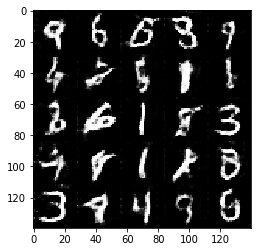

Epoch 1/2... Discriminator Loss: 1.9889... Generator Loss: 0.2390


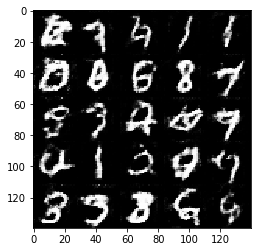

Epoch 2/2... Discriminator Loss: 1.8945... Generator Loss: 0.1980


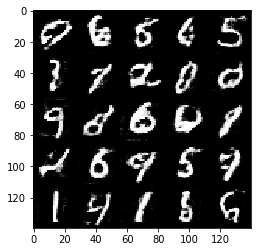

Epoch 2/2... Discriminator Loss: 2.4070... Generator Loss: 0.1131


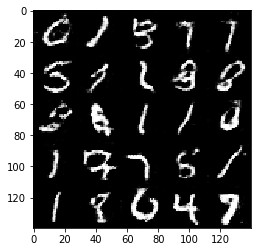

Epoch 2/2... Discriminator Loss: 2.1513... Generator Loss: 0.1612


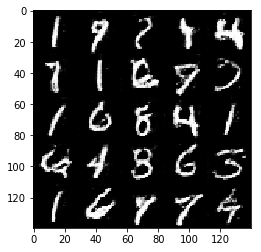

Epoch 2/2... Discriminator Loss: 2.5114... Generator Loss: 0.5059


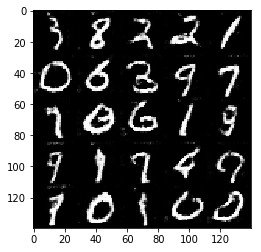

Epoch 2/2... Discriminator Loss: 1.5295... Generator Loss: 0.5846


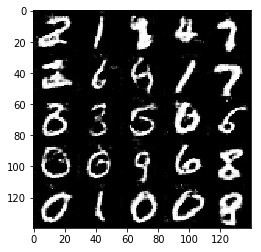

Epoch 2/2... Discriminator Loss: 1.8270... Generator Loss: 0.2414


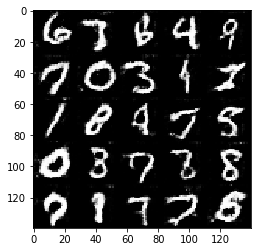

Epoch 2/2... Discriminator Loss: 2.1678... Generator Loss: 0.1595


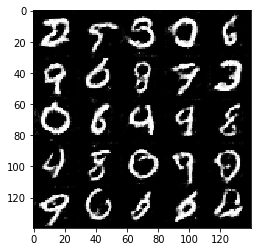

Epoch 2/2... Discriminator Loss: 1.7690... Generator Loss: 0.2720


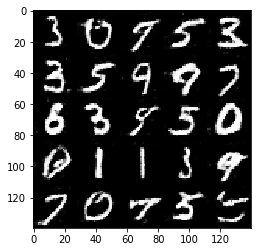

Epoch 2/2... Discriminator Loss: 1.7205... Generator Loss: 0.2680


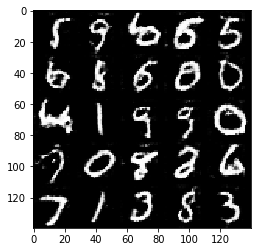

In [22]:
batch_size = 64
z_dim = 128
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... Discriminator Loss: 3.4036... Generator Loss: 0.0580


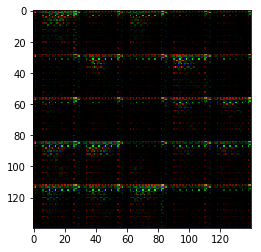

Epoch 1/2... Discriminator Loss: 2.0465... Generator Loss: 0.2820


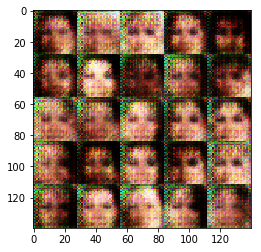

Epoch 1/2... Discriminator Loss: 2.2746... Generator Loss: 0.2021


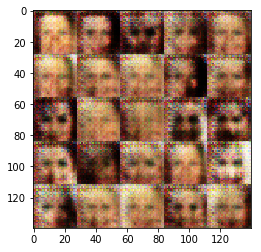

Epoch 1/2... Discriminator Loss: 1.9422... Generator Loss: 0.3159


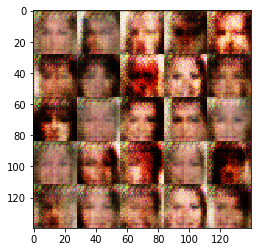

Epoch 1/2... Discriminator Loss: 2.0200... Generator Loss: 0.2828


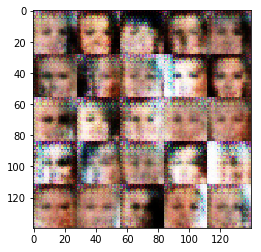

Epoch 1/2... Discriminator Loss: 1.7281... Generator Loss: 0.3828


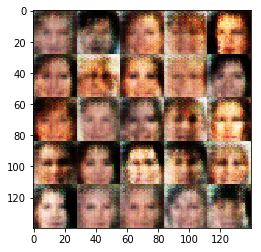

Epoch 1/2... Discriminator Loss: 1.6680... Generator Loss: 0.4571


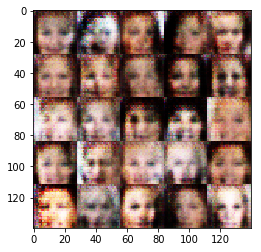

Epoch 1/2... Discriminator Loss: 1.6842... Generator Loss: 0.4371


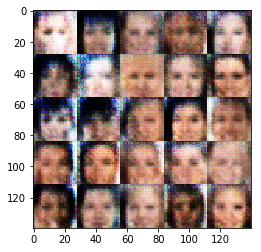

Epoch 1/2... Discriminator Loss: 1.5051... Generator Loss: 0.5075


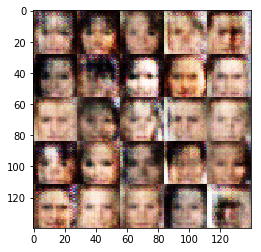

Epoch 1/2... Discriminator Loss: 1.5929... Generator Loss: 0.4650


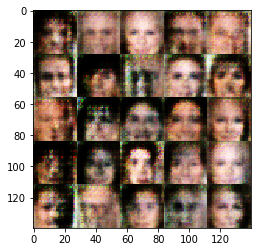

Epoch 1/2... Discriminator Loss: 1.6259... Generator Loss: 0.4864


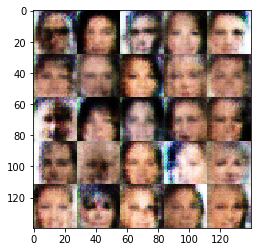

Epoch 1/2... Discriminator Loss: 1.6439... Generator Loss: 0.5021


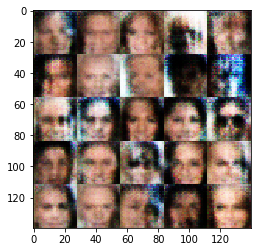

Epoch 1/2... Discriminator Loss: 1.6322... Generator Loss: 0.4759


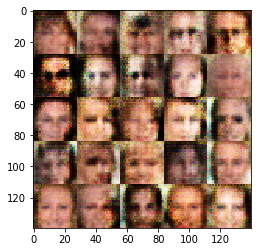

Epoch 1/2... Discriminator Loss: 1.6770... Generator Loss: 0.4476


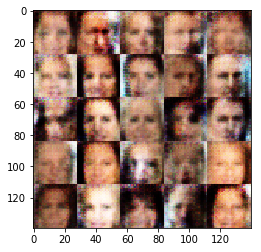

Epoch 1/2... Discriminator Loss: 1.5700... Generator Loss: 0.4827


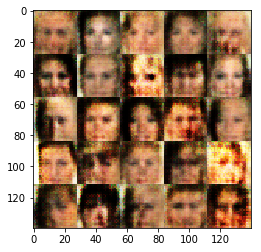

Epoch 1/2... Discriminator Loss: 1.4495... Generator Loss: 0.5775


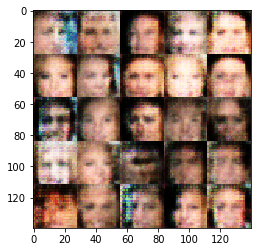

Epoch 1/2... Discriminator Loss: 1.6127... Generator Loss: 0.4818


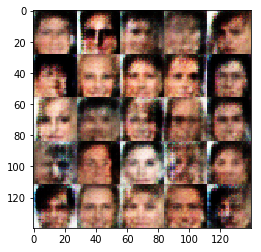

Epoch 1/2... Discriminator Loss: 1.5235... Generator Loss: 0.5333


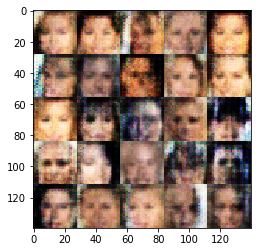

Epoch 1/2... Discriminator Loss: 1.7421... Generator Loss: 0.3994


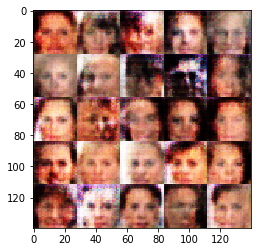

Epoch 1/2... Discriminator Loss: 1.6540... Generator Loss: 0.5226


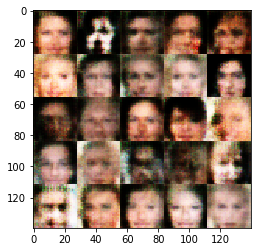

Epoch 1/2... Discriminator Loss: 1.6550... Generator Loss: 0.4891


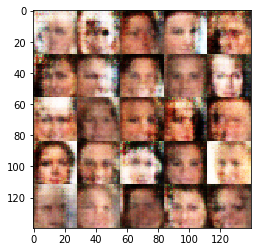

Epoch 1/2... Discriminator Loss: 1.5091... Generator Loss: 0.5278


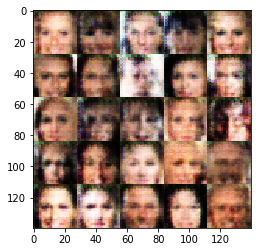

Epoch 1/2... Discriminator Loss: 1.6482... Generator Loss: 0.5254


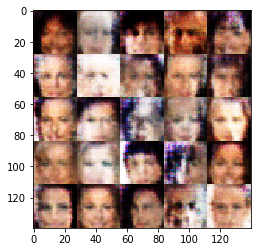

Epoch 1/2... Discriminator Loss: 1.6938... Generator Loss: 0.4790


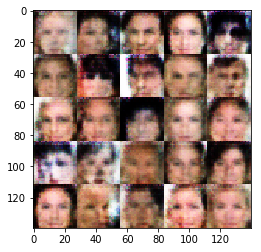

Epoch 1/2... Discriminator Loss: 1.6734... Generator Loss: 0.4605


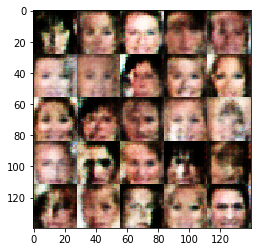

Epoch 1/2... Discriminator Loss: 1.6617... Generator Loss: 0.4657


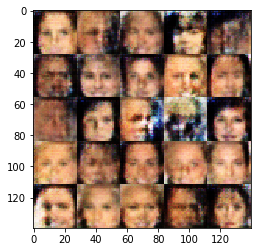

Epoch 1/2... Discriminator Loss: 1.5467... Generator Loss: 0.5015


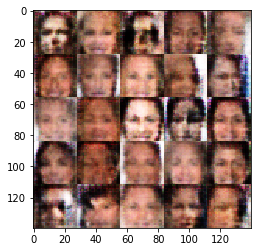

Epoch 1/2... Discriminator Loss: 1.5946... Generator Loss: 0.5166


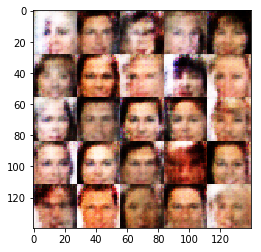

Epoch 1/2... Discriminator Loss: 1.5444... Generator Loss: 0.4926


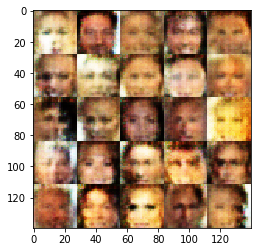

Epoch 1/2... Discriminator Loss: 1.7584... Generator Loss: 0.4023


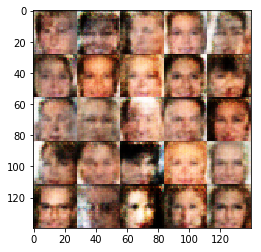

Epoch 1/2... Discriminator Loss: 1.6409... Generator Loss: 0.4722


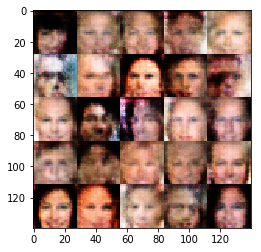

Epoch 1/2... Discriminator Loss: 1.5865... Generator Loss: 0.5056


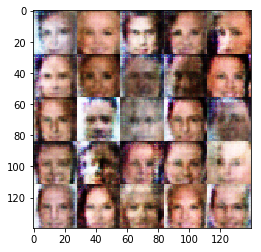

Epoch 1/2... Discriminator Loss: 1.5492... Generator Loss: 0.5361


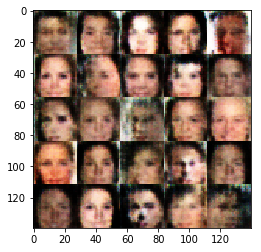

Epoch 1/2... Discriminator Loss: 1.6120... Generator Loss: 0.4796


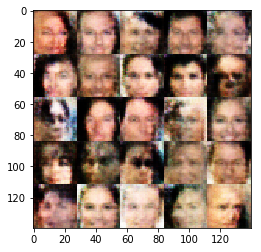

Epoch 1/2... Discriminator Loss: 1.6708... Generator Loss: 0.5105


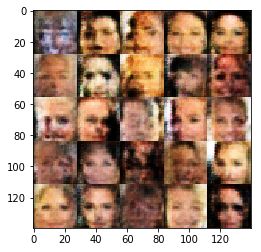

Epoch 1/2... Discriminator Loss: 1.7787... Generator Loss: 0.4047


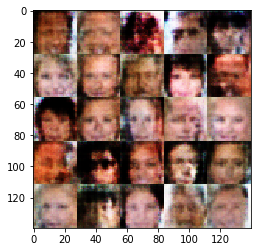

Epoch 1/2... Discriminator Loss: 1.5713... Generator Loss: 0.5268


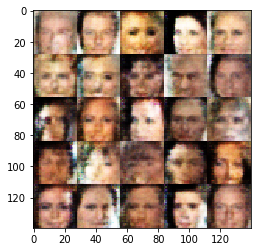

Epoch 1/2... Discriminator Loss: 1.4811... Generator Loss: 0.6154


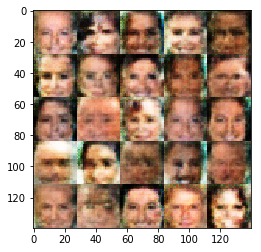

Epoch 1/2... Discriminator Loss: 1.6464... Generator Loss: 0.5317


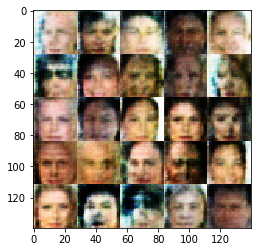

Epoch 1/2... Discriminator Loss: 1.5545... Generator Loss: 0.5159


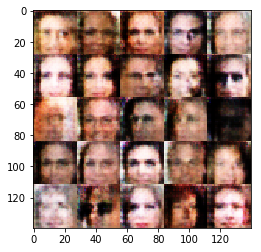

Epoch 1/2... Discriminator Loss: 1.6093... Generator Loss: 0.4933


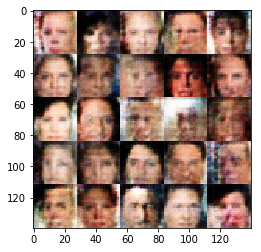

Epoch 1/2... Discriminator Loss: 1.4991... Generator Loss: 0.5800


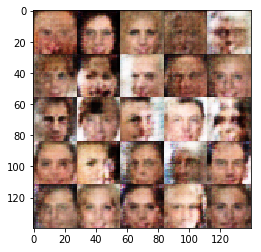

Epoch 1/2... Discriminator Loss: 1.5363... Generator Loss: 0.5474


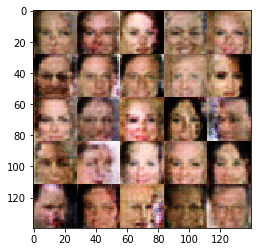

Epoch 1/2... Discriminator Loss: 1.5663... Generator Loss: 0.4797


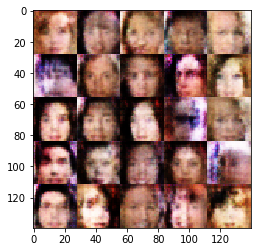

Epoch 1/2... Discriminator Loss: 1.4670... Generator Loss: 0.6242


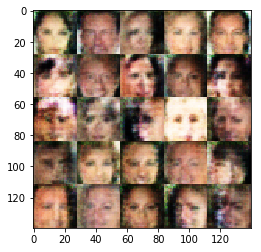

Epoch 1/2... Discriminator Loss: 1.5258... Generator Loss: 0.5543


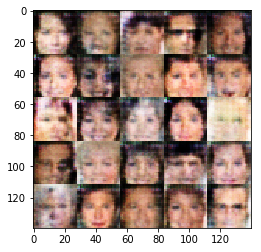

Epoch 1/2... Discriminator Loss: 1.4668... Generator Loss: 0.5217


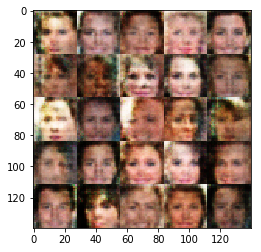

Epoch 1/2... Discriminator Loss: 1.5144... Generator Loss: 0.5723


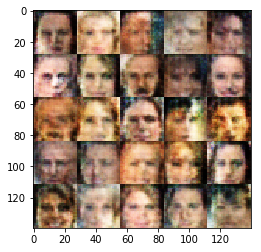

Epoch 1/2... Discriminator Loss: 1.5850... Generator Loss: 0.5008


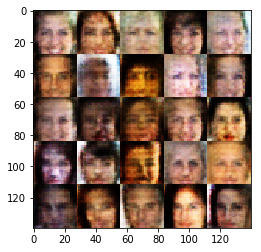

Epoch 1/2... Discriminator Loss: 1.5432... Generator Loss: 0.5350


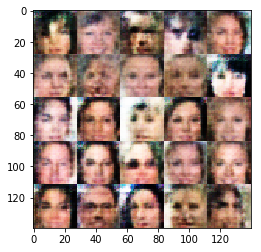

Epoch 1/2... Discriminator Loss: 1.5132... Generator Loss: 0.5866


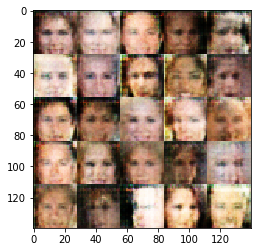

Epoch 1/2... Discriminator Loss: 1.5392... Generator Loss: 0.5307


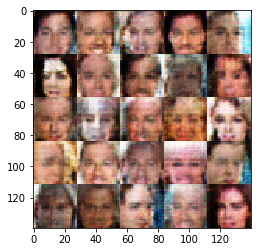

Epoch 1/2... Discriminator Loss: 1.5467... Generator Loss: 0.5341


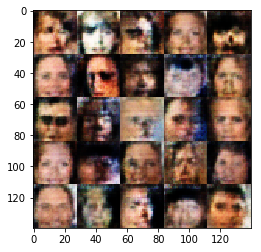

Epoch 1/2... Discriminator Loss: 1.5890... Generator Loss: 0.5230


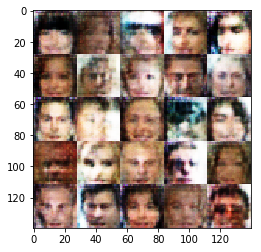

Epoch 1/2... Discriminator Loss: 1.4997... Generator Loss: 0.6071


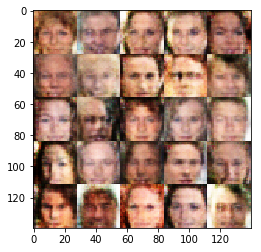

Epoch 1/2... Discriminator Loss: 1.6430... Generator Loss: 0.5092


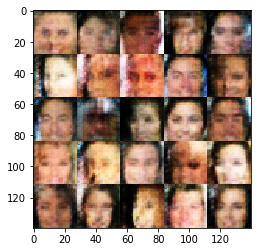

Epoch 1/2... Discriminator Loss: 1.4982... Generator Loss: 0.5941


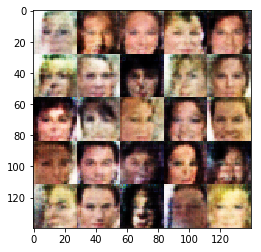

Epoch 1/2... Discriminator Loss: 1.4198... Generator Loss: 0.6510


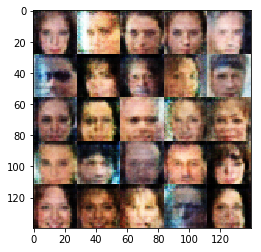

Epoch 1/2... Discriminator Loss: 1.4997... Generator Loss: 0.5662


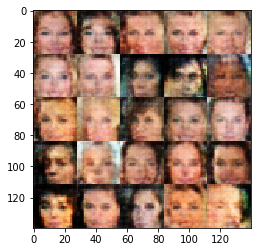

Epoch 1/2... Discriminator Loss: 1.5239... Generator Loss: 0.5771


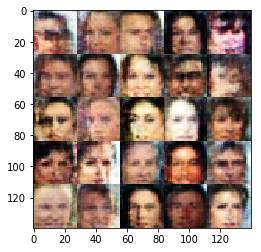

Epoch 1/2... Discriminator Loss: 1.4508... Generator Loss: 0.6366


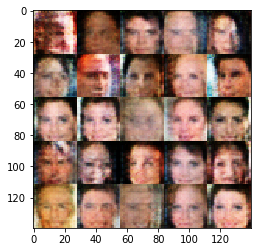

Epoch 1/2... Discriminator Loss: 1.5387... Generator Loss: 0.5350


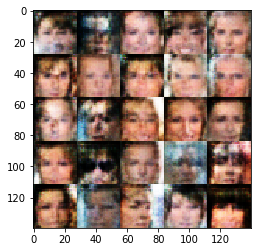

Epoch 1/2... Discriminator Loss: 1.6465... Generator Loss: 0.4535


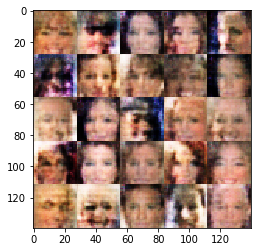

Epoch 2/2... Discriminator Loss: 1.6427... Generator Loss: 0.5286


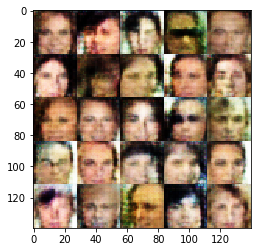

Epoch 2/2... Discriminator Loss: 1.4834... Generator Loss: 0.5491


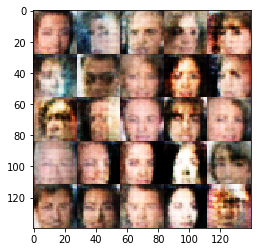

Epoch 2/2... Discriminator Loss: 1.5047... Generator Loss: 0.5804


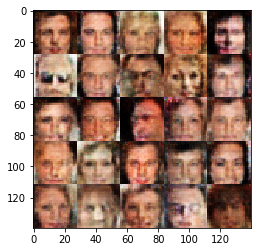

Epoch 2/2... Discriminator Loss: 1.5556... Generator Loss: 0.5185


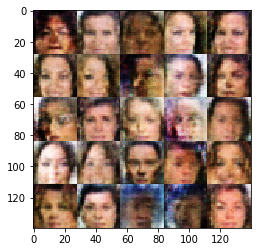

Epoch 2/2... Discriminator Loss: 1.5060... Generator Loss: 0.5399


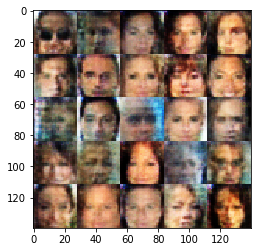

Epoch 2/2... Discriminator Loss: 1.4486... Generator Loss: 0.5899


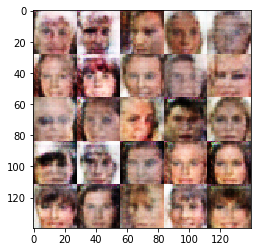

Epoch 2/2... Discriminator Loss: 1.4587... Generator Loss: 0.6072


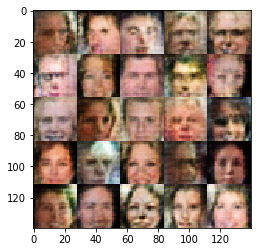

Epoch 2/2... Discriminator Loss: 1.4403... Generator Loss: 0.6430


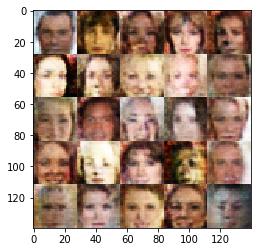

Epoch 2/2... Discriminator Loss: 1.5170... Generator Loss: 0.5670


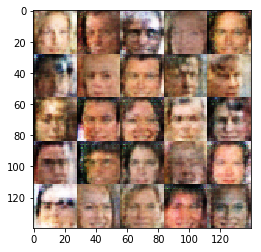

Epoch 2/2... Discriminator Loss: 1.5282... Generator Loss: 0.5656


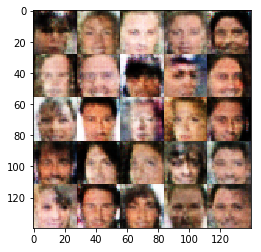

Epoch 2/2... Discriminator Loss: 1.4700... Generator Loss: 0.5943


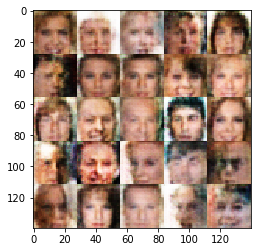

Epoch 2/2... Discriminator Loss: 1.4940... Generator Loss: 0.5395


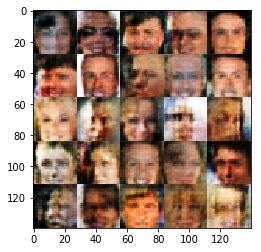

Epoch 2/2... Discriminator Loss: 1.4457... Generator Loss: 0.5959


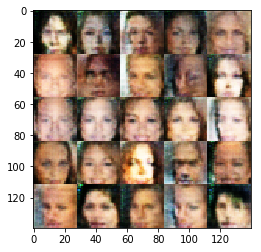

Epoch 2/2... Discriminator Loss: 1.4641... Generator Loss: 0.5142


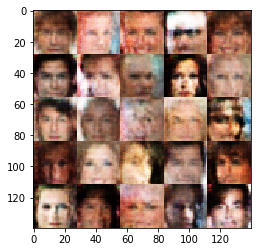

Epoch 2/2... Discriminator Loss: 1.5640... Generator Loss: 0.5940


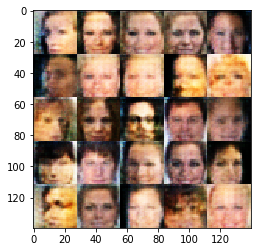

Epoch 2/2... Discriminator Loss: 1.5446... Generator Loss: 0.4968


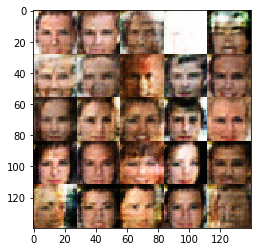

Epoch 2/2... Discriminator Loss: 1.5092... Generator Loss: 0.5418


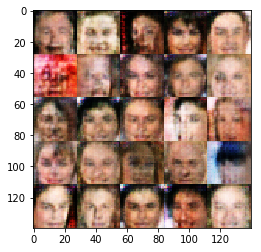

Epoch 2/2... Discriminator Loss: 1.4379... Generator Loss: 0.6223


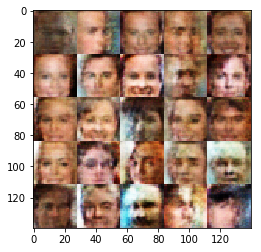

Epoch 2/2... Discriminator Loss: 1.4586... Generator Loss: 0.6460


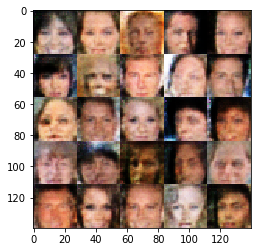

Epoch 2/2... Discriminator Loss: 1.5122... Generator Loss: 0.5821


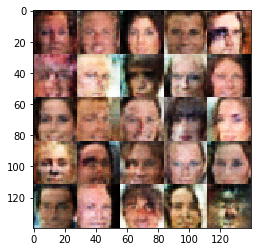

Epoch 2/2... Discriminator Loss: 1.4879... Generator Loss: 0.6298


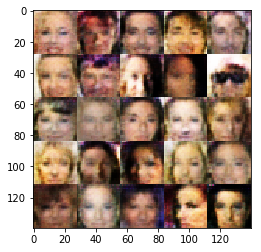

Epoch 2/2... Discriminator Loss: 1.4331... Generator Loss: 0.6599


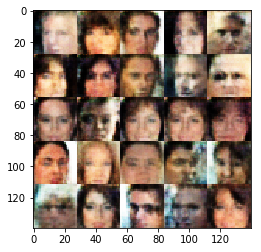

Epoch 2/2... Discriminator Loss: 1.4767... Generator Loss: 0.6129


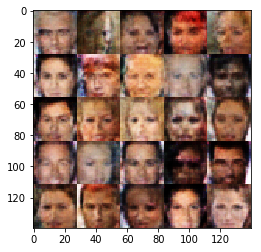

Epoch 2/2... Discriminator Loss: 1.5224... Generator Loss: 0.5415


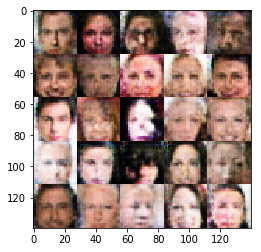

Epoch 2/2... Discriminator Loss: 1.4271... Generator Loss: 0.6368


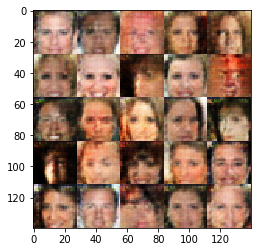

Epoch 2/2... Discriminator Loss: 1.4594... Generator Loss: 0.5922


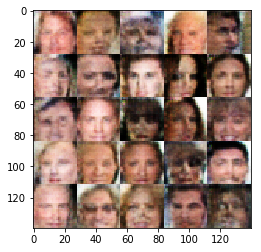

Epoch 2/2... Discriminator Loss: 1.4809... Generator Loss: 0.5574


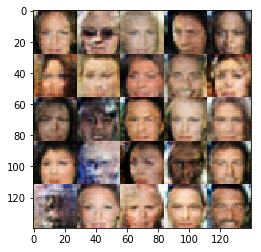

Epoch 2/2... Discriminator Loss: 1.4260... Generator Loss: 0.6082


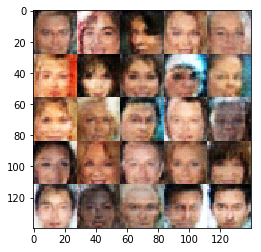

Epoch 2/2... Discriminator Loss: 1.4443... Generator Loss: 0.6034


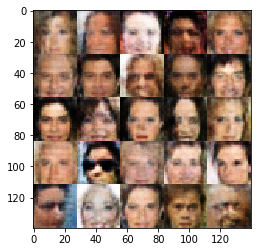

Epoch 2/2... Discriminator Loss: 1.4694... Generator Loss: 0.6056


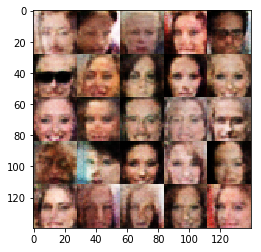

Epoch 2/2... Discriminator Loss: 1.4474... Generator Loss: 0.6577


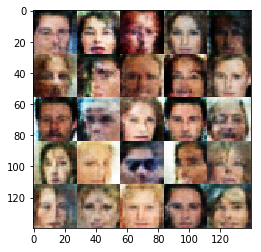

Epoch 2/2... Discriminator Loss: 1.4427... Generator Loss: 0.6334


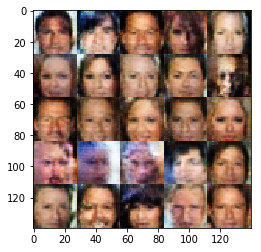

Epoch 2/2... Discriminator Loss: 1.4398... Generator Loss: 0.6145


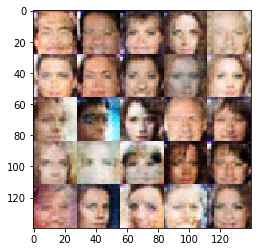

Epoch 2/2... Discriminator Loss: 1.4277... Generator Loss: 0.6270


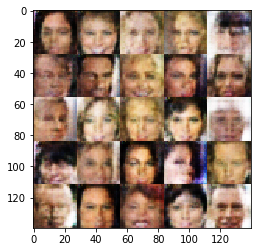

Epoch 2/2... Discriminator Loss: 1.4392... Generator Loss: 0.6173


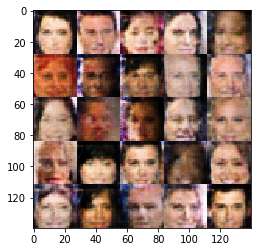

Epoch 2/2... Discriminator Loss: 1.4237... Generator Loss: 0.6206


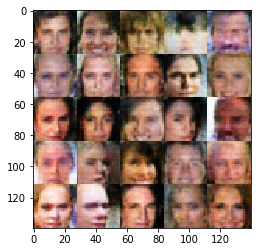

Epoch 2/2... Discriminator Loss: 1.4734... Generator Loss: 0.6086


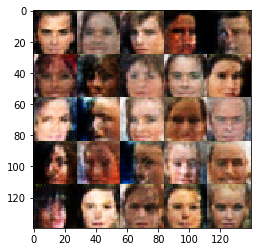

Epoch 2/2... Discriminator Loss: 1.4747... Generator Loss: 0.6083


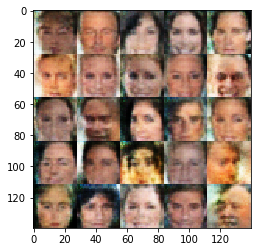

Epoch 2/2... Discriminator Loss: 1.4792... Generator Loss: 0.6035


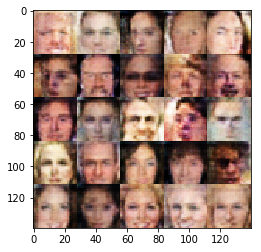

Epoch 2/2... Discriminator Loss: 1.4175... Generator Loss: 0.6420


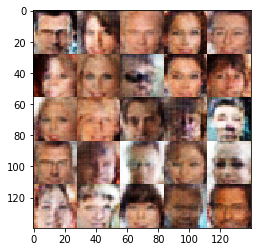

Epoch 2/2... Discriminator Loss: 1.4506... Generator Loss: 0.5983


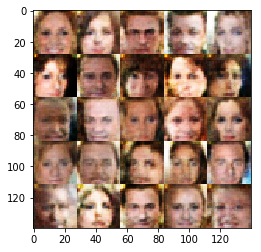

Epoch 2/2... Discriminator Loss: 1.4666... Generator Loss: 0.5722


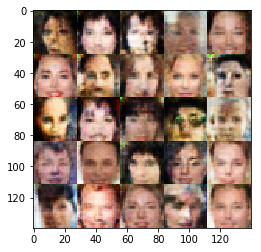

Epoch 2/2... Discriminator Loss: 1.4707... Generator Loss: 0.5863


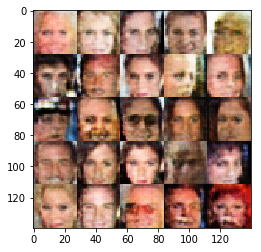

Epoch 2/2... Discriminator Loss: 1.4464... Generator Loss: 0.6218


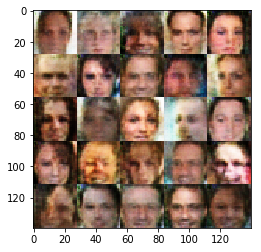

Epoch 2/2... Discriminator Loss: 1.4561... Generator Loss: 0.6086


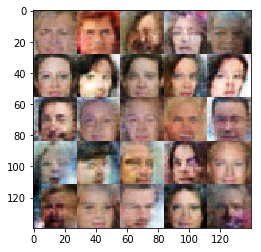

Epoch 2/2... Discriminator Loss: 1.3987... Generator Loss: 0.6779


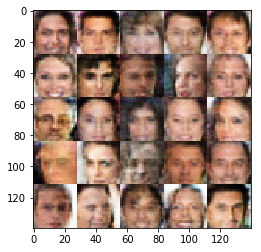

Epoch 2/2... Discriminator Loss: 1.4328... Generator Loss: 0.6140


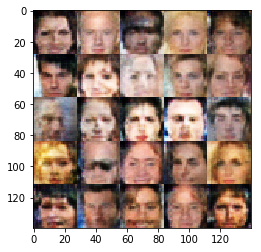

Epoch 2/2... Discriminator Loss: 1.3990... Generator Loss: 0.6482


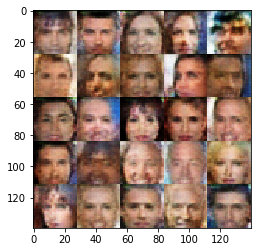

Epoch 2/2... Discriminator Loss: 1.4494... Generator Loss: 0.5928


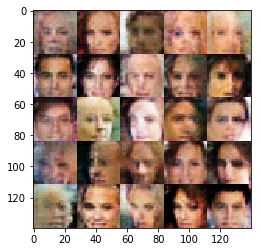

Epoch 2/2... Discriminator Loss: 1.3898... Generator Loss: 0.6714


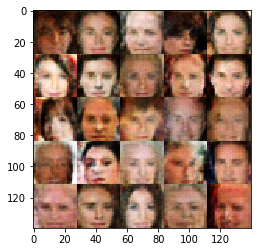

Epoch 2/2... Discriminator Loss: 1.3998... Generator Loss: 0.6442


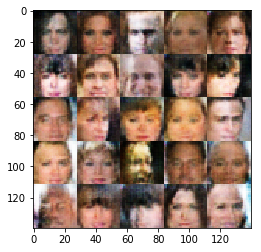

Epoch 2/2... Discriminator Loss: 1.4346... Generator Loss: 0.5830


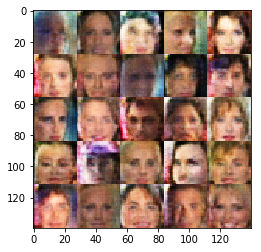

Epoch 2/2... Discriminator Loss: 1.4794... Generator Loss: 0.6197


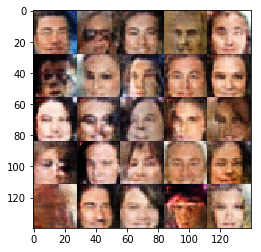

Epoch 2/2... Discriminator Loss: 1.4666... Generator Loss: 0.6432


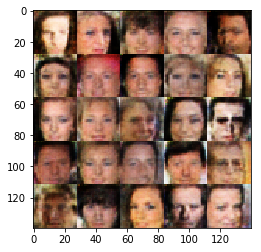

Epoch 2/2... Discriminator Loss: 1.4425... Generator Loss: 0.6414


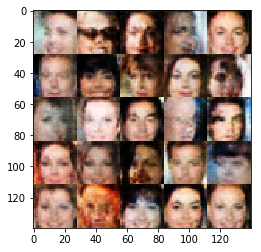

Epoch 2/2... Discriminator Loss: 1.5004... Generator Loss: 0.5936


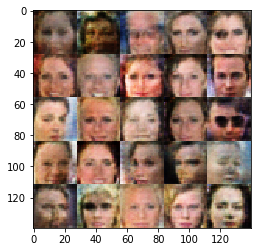

Epoch 2/2... Discriminator Loss: 1.4264... Generator Loss: 0.6118


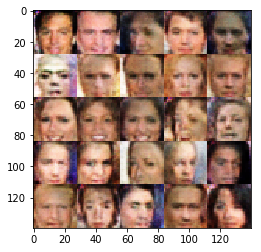

Epoch 2/2... Discriminator Loss: 1.4904... Generator Loss: 0.5764


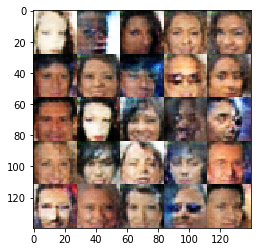

Epoch 2/2... Discriminator Loss: 1.4187... Generator Loss: 0.6263


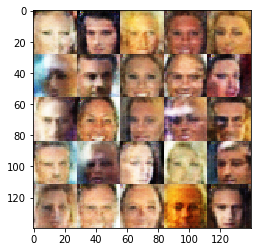

Epoch 2/2... Discriminator Loss: 1.4089... Generator Loss: 0.6746


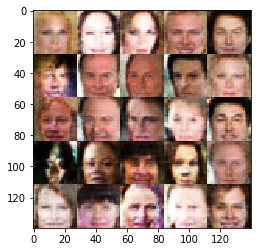

Epoch 2/2... Discriminator Loss: 1.4700... Generator Loss: 0.6218


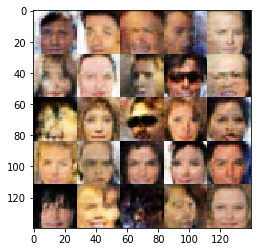

Epoch 2/2... Discriminator Loss: 1.4634... Generator Loss: 0.6410


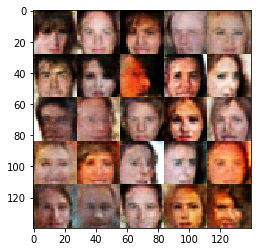

Epoch 2/2... Discriminator Loss: 1.4595... Generator Loss: 0.6194


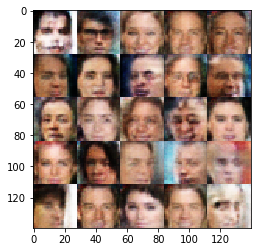

In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.